Mostly applied Fonda's code to peak hours analysis

In [1]:
# import libraries
import pandas as pd
import geopandas as gpd

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

import contextily as ctx

# for interactive plots, similar to geopands (your choice between folium vs plotly)
import plotly.express as px

import networkx as nx

import numpy as np
import scipy.stats
import seaborn.palettes
import seaborn.utils
import matplotlib
import folium
import mapclassify

C:\Users\ntuki\AppData\Roaming\Python\Python39\site-packages\networkx\utils\backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))


In [2]:
# read data
morning_peak_freq = pd.read_csv("uber_tripdata_2021_weekday_morning_peak_frequency.csv", compression="gzip")
evening_peak_freq = pd.read_csv("uber_tripdata_2021_weekday_evening_peak_frequency.csv", compression="gzip")
morning_peak_deg = pd.read_csv("uber_tripdata_2021_weekday_morning_peak_degrees.csv", compression="gzip")
evening_peak_deg = pd.read_csv("uber_tripdata_2021_weekday_evening_peak_degrees.csv", compression="gzip")

Plot reverse frequency against frequency

In [3]:
def plot_freq_vs_rev_freq(df, filename, title_cont):
    plt.figure(figsize=(10, 6))
    plt.scatter(df["frequency"], df["reverse_freq"], alpha=0.6)
    plt.xlabel("Frequency of rides from pick-up location to drop-off location")
    plt.ylabel("Frequency of rides from drop-off location to pick-up location")
    plt.title("Frequency of Uber Rides in Both Directions at %s"%title_cont)
    plt.grid(True)
    
    # save figure in a png file
    filename = filename + ".png"
    plt.savefig(filename, bbox_inches="tight")
    plt.close()

In [4]:
plot_freq_vs_rev_freq(morning_peak_freq, "freq_vs_rev_freq_morn_peak", "8AM")
plot_freq_vs_rev_freq(evening_peak_freq, "freq_vs_rev_freq_even_peak", "6PM")

Plot ratio of in- to out-degrees and ratio of out- to in-degrees on maps

In [5]:
# gdf_taxi = gpd.read_file('NYC Taxi Zones.geojson',crs='EPSG:4326')

In [6]:
gdf_taxi = gpd.read_file('taxicab_districtzoning.geojson') # updated

In [7]:
gdf_taxi.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [8]:
gdf_taxi.explore()

In [9]:
df_taxi_uber= pd.read_csv('taxi_zone_lookup.csv')

In [10]:
gdf_taxi.head()

,shape_area,objectid,shape_leng,location_id,zone,borough,C,M,P,R,B,geometry
0,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,0.000000,0.000000,0.000000,0.000000,0.0,"MULTIPOLYGON (((933100.918 192536.086, 933091...."
1,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,0.000015,0.000040,0.962789,0.030914,0.0,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,0.060503,0.000031,0.005435,0.934031,0.0,"MULTIPOLYGON (((1026308.770 256767.698, 102649..."
3,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,0.004414,0.046019,0.107636,0.841930,0.0,"MULTIPOLYGON (((992073.467 203714.076, 992068...."
4,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,0.000000,0.000116,0.163336,0.836548,0.0,"MULTIPOLYGON (((935843.310 144283.336, 936046...."


In [11]:
df_taxi_uber.head()

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [12]:
df_uber = df_taxi_uber.merge(gdf_taxi,how='inner',left_on = ['Zone','Borough'],right_on=['zone','borough'])

In [13]:
df_uber.shape

(271, 16)

In [14]:
df_taxi_uber.shape

(265, 4)

In [15]:
df_uber = gpd.GeoDataFrame(df_uber,crs='EPSG:2263')

In [16]:
df_uber.explore()

In [17]:
df_uber[df_uber['Zone'].str.contains('Newark')].geometry.centroid

0    POINT (935996.821 191376.750)
dtype: geometry

In [18]:
df_uber['geometry'] = df_uber['geometry'].to_crs('EPSG:4326').centroid
df_uber.head()

C:\Users\ntuki\AppData\Local\Temp\ipykernel_27596\1632330679.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df_uber['geometry'] = df_uber['geometry'].to_crs('EPSG:4326').centroid


,LocationID,Borough,Zone,service_zone,shape_area,objectid,shape_leng,location_id,zone,borough,C,M,P,R,B,geometry
0,1,EWR,Newark Airport,EWR,0.0007823067885,1,0.116357453189,1,Newark Airport,EWR,0.000000,0.000000,0.000000,0.000000,0.0,POINT (-74.17400 40.69183)
1,2,Queens,Jamaica Bay,Boro Zone,0.00486634037837,2,0.43346966679,2,Jamaica Bay,Queens,0.000015,0.000040,0.962789,0.030914,0.0,POINT (-73.83130 40.61675)
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone,0.000314414156821,3,0.0843411059012,3,Allerton/Pelham Gardens,Bronx,0.060503,0.000031,0.005435,0.934031,0.0,POINT (-73.84742 40.86447)
3,4,Manhattan,Alphabet City,Yellow Zone,0.000111871946192,4,0.0435665270921,4,Alphabet City,Manhattan,0.004414,0.046019,0.107636,0.841930,0.0,POINT (-73.97697 40.72375)
4,5,Staten Island,Arden Heights,Boro Zone,0.000497957489363,5,0.0921464898574,5,Arden Heights,Staten Island,0.000000,0.000116,0.163336,0.836548,0.0,POINT (-74.18848 40.55266)


In [19]:
df_uber.to_file('taxicab_lookup_geocoded_updated.geojson')

In [20]:
df_uber.shape

(271, 16)

In [21]:
#A = np.random.randint(2, size=(len(df_uber), len(df_uber)))
A = np.random.choice([0, 1],size = (len(df_uber),len(df_uber)),p=[0.9,0.1])
A

array([[0, 1, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 1, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 1, 1, ..., 0, 0, 0]])

In [22]:
positions = list(zip(df_uber.geometry.x,df_uber.geometry.y))
positions


[(-74.17400027276304, 40.69183120640133),
 (-73.83129854302226, 40.61674529165972),
 (-73.84742223236717, 40.86447368477526),
 (-73.97696825691767, 40.72375214158462),
 (-74.1884841018493, 40.55265928694544),
 (-74.07177055895129, 40.60032414603443),
 (-73.91969431946072, 40.76149256216355),
 (-73.9230861575075, 40.77855865375053),
 (-73.78794887777899, 40.751035025572165),
 (-73.7909863598696, 40.67895331011511),
 (-74.00748815801174, 40.604272840030575),
 (-74.01556351255891, 40.702945834984476),
 (-74.01607915192923, 40.712038157074346),
 (-74.0298923741879, 40.624834923607985),
 (-73.7859722787771, 40.78333304726079),
 (-73.77342181890135, 40.762738375442204),
 (-73.94990503507513, 40.69150749488046),
 (-73.89018328872035, 40.867682456075215),
 (-73.72665537528707, 40.735486779763214),
 (-73.8858674810697, 40.8577796754414),
 (-73.9835370967223, 40.60142943983499),
 (-73.99525857986231, 40.61221825780543),
 (-74.17088688155219, 40.606447701027314),
 (-73.96547951516968, 40.80197049

In [23]:
G = nx.DiGraph()

# Add edges based on the array values
for i in range(len(df_uber)):
    for j in range(len(df_uber)):
        if A[i,j] == 1:
            G.add_edge(i, j)
node_positions = {node: positions[i] for i, node in enumerate(G.nodes)}


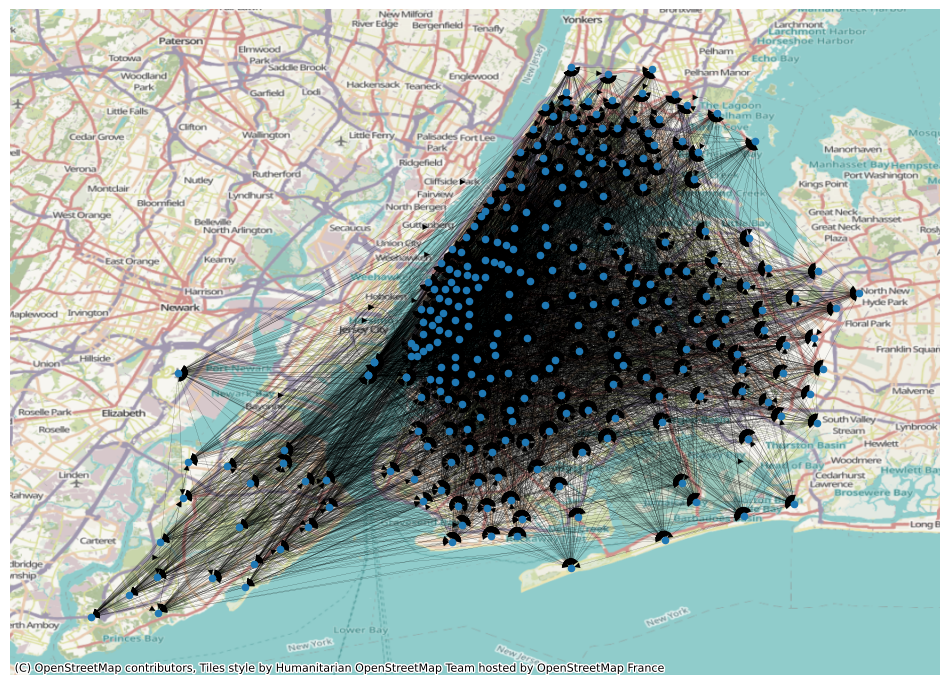

In [24]:
fig, ax = plt.subplots(figsize=(12, 12))
nx.draw(G, pos=node_positions, node_size=20, with_labels=False, arrows=True, width=0.1)

ctx.add_basemap(ax, crs=4326)

In [25]:
# read data
morning_peak_freq = pd.read_csv("uber_tripdata_2021_weekday_morning_peak_frequency.csv", compression="gzip")
evening_peak_freq = pd.read_csv("uber_tripdata_2021_weekday_evening_peak_frequency.csv", compression="gzip")
morning_peak_deg = pd.read_csv("uber_tripdata_2021_weekday_morning_peak_degrees.csv", compression="gzip")
evening_peak_deg = pd.read_csv("uber_tripdata_2021_weekday_evening_peak_degrees.csv", compression="gzip")

In [26]:
morning_peak_deg.head()

,LocationID,in_degree,out_degree,ratio_of_in_to_out_deg,ratio_of_out_to_in_deg
0,1,25855,0,inf,0.000000
1,2,17,8,2.125000,0.470588
2,3,11670,12890,0.905353,1.104542
3,4,5216,15240,0.342257,2.921779
4,5,778,2020,0.385149,2.596401


In [27]:
def find_missing_nodes(df):
    # df: a dataframe, e.g. morning_peak_deg
    num_nodes = np.array(G.nodes)
    num_df_nodes = np.array(df["LocationID"].unique())
    
    diff_1 = np.setdiff1d(num_nodes, num_df_nodes)
    diff_2 = np.setdiff1d(num_df_nodes, num_nodes)
    diff = np.concatenate((diff_1, diff_2))
    
    return diff

In [28]:
# find missing nodes in morning_peak_deg and evening_peak_deg
morning_diff = find_missing_nodes(morning_peak_deg)
print(morning_diff)

evening_diff = find_missing_nodes(evening_peak_deg)
print(evening_diff)

[  0 103 104 199 264 265 266 267 268 269 270]
[  0 103 104 199 264 265 266 267 268 269 270]


In [29]:
import math

In [30]:
morning_peak_deg.loc[(morning_peak_deg["ratio_of_in_to_out_deg"]==0)|(morning_peak_deg["ratio_of_in_to_out_deg"]==math.inf)|(morning_peak_deg["ratio_of_out_to_in_deg"]==0)|(morning_peak_deg["ratio_of_out_to_in_deg"]==math.inf)]

,LocationID,in_degree,out_degree,ratio_of_in_to_out_deg,ratio_of_out_to_in_deg
0,1,25855,0,inf,0.0


In [31]:
evening_peak_deg.loc[(evening_peak_deg["ratio_of_in_to_out_deg"]==0)|(evening_peak_deg["ratio_of_in_to_out_deg"]==math.inf)|(evening_peak_deg["ratio_of_out_to_in_deg"]==0)|(evening_peak_deg["ratio_of_out_to_in_deg"]==math.inf)]

,LocationID,in_degree,out_degree,ratio_of_in_to_out_deg,ratio_of_out_to_in_deg
0,1,11156,0,inf,0.0
102,105,3,0,inf,0.0


In [32]:
def add_missing_nodes(df, missing_nodes):
    # df: a dataframe, e.g. morning_peak_deg
    # missing_nodes: a list or array of missing LocationIDs
    
    for i in missing_nodes:
        # set ratio_of_in_to_out_deg and ratio_of_out_to_in_deg as 0
        df.loc[len(df.index)] = [i, 0, 0, 0, 0]

    df["LocationID"] = df["LocationID"].astype(int)
    df["in_degree"] = df["in_degree"].astype(int)
    df["out_degree"] = df["out_degree"].astype(int)
    
    return df

In [33]:
# add missing nodes to each dataframe
morning_peak_deg = add_missing_nodes(morning_peak_deg, morning_diff)
evening_peak_deg = add_missing_nodes(evening_peak_deg, evening_diff)

In [34]:
morning_peak_deg.tail(12)

,LocationID,in_degree,out_degree,ratio_of_in_to_out_deg,ratio_of_out_to_in_deg
259,263,18546,34748,0.533729,1.873612
260,0,0,0,0.000000,0.000000
261,103,0,0,0.000000,0.000000
262,104,0,0,0.000000,0.000000
263,199,0,0,0.000000,0.000000
264,264,0,0,0.000000,0.000000
265,265,0,0,0.000000,0.000000
266,266,0,0,0.000000,0.000000
267,267,0,0,0.000000,0.000000
268,268,0,0,0.000000,0.000000


In [35]:
evening_peak_deg.tail(12)

,LocationID,in_degree,out_degree,ratio_of_in_to_out_deg,ratio_of_out_to_in_deg
259,263,32049,27796,1.153008,0.867297
260,0,0,0,0.000000,0.000000
261,103,0,0,0.000000,0.000000
262,104,0,0,0.000000,0.000000
263,199,0,0,0.000000,0.000000
264,264,0,0,0.000000,0.000000
265,265,0,0,0.000000,0.000000
266,266,0,0,0.000000,0.000000
267,267,0,0,0.000000,0.000000
268,268,0,0,0.000000,0.000000


In [36]:
def get_ratio_in_to_out(df):
    ratio_in_to_out = list(df["ratio_of_in_to_out_deg"])
    to_exclude = df.loc[(df["ratio_of_in_to_out_deg"]==math.inf)|(df["ratio_of_in_to_out_deg"]==0)]
    index_to_exclude = list(to_exclude.index)
    df_after_dropped = df.drop(index=index_to_exclude)
    max_wo_inf = df_after_dropped["ratio_of_in_to_out_deg"].max()

    # referred to https://www.geeksforgeeks.org/python-program-to-replace-elements-of-a-list-based-on-the-comparison-with-a-number/
    # replace infinity with non-infinite maximum
    replace_inf = lambda x: max_wo_inf if x == math.inf else x
    ratio_in_to_out = list(map(replace_inf, ratio_in_to_out))

    df_ratio = df.drop(columns=["in_degree", "out_degree", "ratio_of_out_to_in_deg"])
    df_ratio.loc[df_ratio["ratio_of_in_to_out_deg"]==math.inf, "ratio_of_in_to_out_deg"] = max_wo_inf

    gdf_taxi['location_id'] = gdf_taxi['location_id'].astype(int)
    df_ratio = gpd.GeoDataFrame(df_ratio.merge(gdf_taxi,how='left',left_on='LocationID',right_on='location_id'))

    return ratio_in_to_out, df_ratio

In [37]:
morning_peak_deg.head()

,LocationID,in_degree,out_degree,ratio_of_in_to_out_deg,ratio_of_out_to_in_deg
0,1,25855,0,inf,0.000000
1,2,17,8,2.125000,0.470588
2,3,11670,12890,0.905353,1.104542
3,4,5216,15240,0.342257,2.921779
4,5,778,2020,0.385149,2.596401


In [38]:
morning_peak_deg.loc[(morning_peak_deg["ratio_of_out_to_in_deg"]==math.inf)|(morning_peak_deg["ratio_of_out_to_in_deg"]==0)]

,LocationID,in_degree,out_degree,ratio_of_in_to_out_deg,ratio_of_out_to_in_deg
0,1,25855,0,inf,0.0
260,0,0,0,0.0,0.0
261,103,0,0,0.0,0.0
262,104,0,0,0.0,0.0
263,199,0,0,0.0,0.0
264,264,0,0,0.0,0.0
265,265,0,0,0.0,0.0
266,266,0,0,0.0,0.0
267,267,0,0,0.0,0.0
268,268,0,0,0.0,0.0


In [39]:
def get_ratio_out_to_in(df):
    ratio_out_to_in = list(df["ratio_of_out_to_in_deg"])

    df_ratio = df.drop(columns=["in_degree", "out_degree", "ratio_of_in_to_out_deg"])

    gdf_taxi['location_id'] = gdf_taxi['location_id'].astype(int)
    df_ratio = gpd.GeoDataFrame(df_ratio.merge(gdf_taxi,how='left',left_on='LocationID',right_on='location_id'))

    return ratio_out_to_in, df_ratio

In [40]:
def plot_on_map(geodf, column_to_plot, title, filename):
    # geodf: a geodataframe, e.g. df_morn_ratio
    # column_to_plot: a string with the name of the column of interest, e.g. "ratio_of_in_to_out_deg"
    # title: a string for plot title, e.g. 'Ratio of In- to Out-Degree (8AM)'
    # filename: a string for the filename to save figure as
    geodf.plot(column=column_to_plot, legend=True)
    plt.axis('off')
    plt.title(title)
    
    # save figure in a png file
    filename = filename + ".png"
    plt.savefig(filename, bbox_inches="tight")
    plt.close()

In [41]:
def plot_nodes_on_map(ratio, cbar_label, filename):
    # ratio: a list of ratios to color nodes by
    # cbar_label: a string for the colorbar label
    # filename: a string for the filename to save figure as
    
    fig, ax = plt.subplots(figsize=(12, 12))

    vmin = min(ratio)
    vmax = max(ratio)
    cmap = plt.cm.viridis
    
    nx.draw_networkx_nodes(G, pos=node_positions, node_color=ratio, node_size=20, cmap=cmap, vmin=vmin, vmax=vmax)
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array([])
    cbar = plt.colorbar(sm)
    cbar.set_label(cbar_label)
    
    ctx.add_basemap(ax, crs=4326)

    # save figure in a png file
    filename = filename + ".png"
    plt.savefig(filename, bbox_inches="tight")
    plt.close()

In [42]:
# Plot ratio of in- to out-degrees on maps for 8AM and 6PM trips
morn_ratio_in_to_out, df_morn_ratio_in_to_out = get_ratio_in_to_out(morning_peak_deg)
plot_on_map(df_morn_ratio_in_to_out, "ratio_of_in_to_out_deg", "Ratio of In- to Out-Degree (8AM)", "morning_ratio_in_to_out_map")
plot_nodes_on_map(morn_ratio_in_to_out, "Ratio of In- to Out-Degree of Node (8AM)", "morning_ratio_in_to_out_map_w_nodes")

even_ratio_in_to_out, df_even_ratio_in_to_out = get_ratio_in_to_out(evening_peak_deg)
plot_on_map(df_even_ratio_in_to_out, "ratio_of_in_to_out_deg", "Ratio of In- to Out-Degree (6PM)", "evening_ratio_in_to_out_map")
plot_nodes_on_map(even_ratio_in_to_out, "Ratio of In- to Out-Degree of Node (6PM)", "evening_ratio_in_to_out_map_w_nodes")

In [43]:
# Plot ratio of out- to in-degrees on maps for 8AM and 6PM trips
morn_ratio_out_to_in, df_morn_ratio_out_to_in = get_ratio_out_to_in(morning_peak_deg)
plot_on_map(df_morn_ratio_out_to_in, "ratio_of_out_to_in_deg", "Ratio of Out- to In-Degree (8AM)", "morning_ratio_out_to_in_map")
plot_nodes_on_map(morn_ratio_out_to_in, "Ratio of Out- to In-Degree of Node (8AM)", "morning_ratio_out_to_in_map_w_nodes")

even_ratio_out_to_in, df_even_ratio_out_to_in = get_ratio_out_to_in(evening_peak_deg)
plot_on_map(df_even_ratio_out_to_in, "ratio_of_out_to_in_deg", "Ratio of Out- to In-Degree (6PM)", "evening_ratio_out_to_in_map")
plot_nodes_on_map(even_ratio_out_to_in, "Ratio of Out- to In-Degree of Node (6PM)", "evening_ratio_out_to_in_map_w_nodes")